In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [37]:
data= pd.read_csv('/content/drive/MyDrive/data.csv')

In [38]:
data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [39]:
data.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

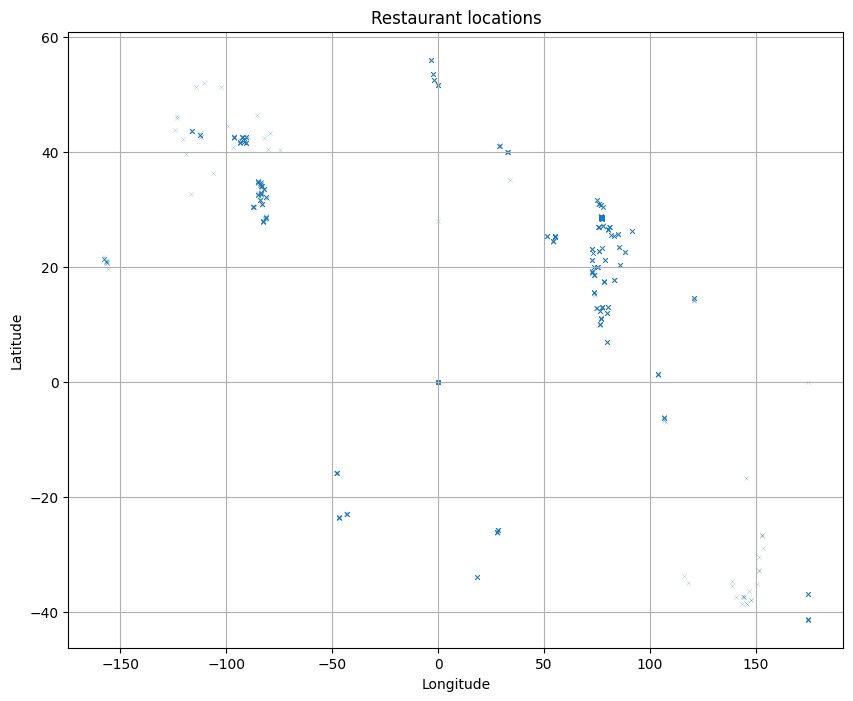

In [40]:
plt.figure(figsize=(10,8))
sns.scatterplot(x='Longitude',y='Latitude',data=data,marker='x',s=10,alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Restaurant locations')
plt.grid(True)
plt.show()

plot the locations of restaurants on a map using longitude and latitude coordinates

In [41]:
!pip install folium

In [42]:
import folium


In [43]:
#calculate the mean latitude and longitude to centre the map
mean_latitude=data['Latitude'].mean()
mean_longitude=data['Longitude'].mean()

#create a folium map centered around the mean coordinates
restaurant_map = folium.Map(location=[mean_latitude,mean_longitude],zoom_start=12,width=800,height=600)

#iterate through the dataset and add markers for each restaurant
for index,row in data.iterrows():
    folium.Marker([row['Latitude'],row['Longitude']],tooltip=row['Restaurant Name']).add_to(restaurant_map)

for index,row in data.iterrows():
    folium.Marker(
        location=[row['Latitude'],row['Longitude']],
        tooltip=row['Restaurant Name'],
        icon=folium.Icon(icon='cloud')
    ).add_to(restaurant_map)

#display the map
restaurant_map.save('restaurant_map.html')
restaurant_map

Output hidden; open in https://colab.research.google.com to view.

In [44]:
#Identify any patterns or clusters of restaurants  in specific areas

In [45]:
from sklearn.preprocessing import StandardScaler
# normalize latitude and lobgitude
scaler=StandardScaler()
data[['Latitude','Longitude']]=scaler.fit_transform(data[['Latitude','Longitude']])
data[['Latitude','Longitude']]

,Latitude,Longitude
0,-1.025581,1.372269
1,-1.026647,1.371945
2,-1.024131,1.372975
3,-1.023775,1.372966
4,-1.023854,1.372991
...,...,...
9546,1.378025,-0.847685
9547,1.376849,-0.846144
9548,1.381025,-0.846305
9549,1.381221,-0.846272


In [46]:
from sklearn.cluster import KMeans
n_clusters=5 #no of clusters(you can adjust this)
Kmeans = KMeans(n_clusters=n_clusters,random_state=0)
data['Cluster'] = Kmeans.fit_predict(data[['Latitude','Longitude']])
data['Cluster']

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0       1
1       1
2       1
3       1
4       1
       ..
9546    0
9547    0
9548    0
9549    0
9550    0
Name: Cluster, Length: 9551, dtype: int32

In [47]:
#add markers to each cluster
for cluster in range(n_clusters):
  cluster_data= data[data['Cluster']==cluster]
  for index ,row in cluster_data.iterrows():
    folium.Marker(
        location=[row['Latitude'],row['Longitude']],
        tooltip=row['Restaurant Name'],
    ).add_to(restaurant_map)

#display the map
restaurant_map.save('restaurant_cluster.html')
restaurant_map